<font size="6">**Extended Project #2**</font>

<font size="4">**Predict Length of Stay with Decision Tree-type, Ensemble and Neural Networks models.**</font>


Eszter Pazmandi

<font size="3">**Project Summary (Table of Contents)**</font>

1. Preprocess data
    - create new features regarding length of stay + number of comorbidities
2. Create a data preprocessing pipeline with ColumnTransformer
3. Decision Tree model (with GridSearch)
4. Other Tree-type models (RandomForest, XGBoost, GradientBoost, AdaBoost)
5. Ensembling techniques
    - Stacking predictors
    - SuperLearner
    - Feature Propagation
6. Neural Netoworks
    - with sklearn
    - with tensorflow
7. Compare results and interpret best model with SHAP

## Imports

In [1]:
# imports
import os
import matplotlib.pylab as plt 
from helper_functions import *
import pandas as pd
import numpy as np
import sklearn
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR 
from sklearn import preprocessing
from sklearn.metrics import  r2_score, mean_squared_error
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import sklearn
from sklearn.model_selection import GridSearchCV
import pickle
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor #, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error

# set seaborn palette
sns.set_palette("Set2")

In [2]:
# working directories
data="/Users/pazma/Documents/BSE/cml/mimic_data/"
project_dir="/Users/pazma/Documents/BSE/cml/2_decision_tree_project/"

In [3]:
# import custom-made functions
os.chdir(project_dir)
from functions_DTproject import *

[MLENS] backend: threading


In [4]:
# import Training dataset
train_raw=pd.read_csv(data+'mimic_train.csv')
train_raw.head()

,HOSPITAL_EXPIRE_FLAG,subject_id,hadm_id,icustay_id,HeartRate_Min,HeartRate_Max,HeartRate_Mean,SysBP_Min,SysBP_Max,SysBP_Mean,...,Diff,ADMISSION_TYPE,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,ICD9_diagnosis,FIRST_CAREUNIT,LOS
0,0,55440,195768,228357,89.0,145.0,121.043478,74.0,127.0,106.586957,...,-61961.78470,EMERGENCY,Medicare,PROTESTANT QUAKER,SINGLE,WHITE,GASTROINTESTINAL BLEED,5789,MICU,4.5761
1,0,76908,126136,221004,63.0,110.0,79.117647,89.0,121.0,106.733333,...,-43146.18378,EMERGENCY,Private,UNOBTAINABLE,MARRIED,WHITE,ESOPHAGEAL FOOD IMPACTION,53013,MICU,0.7582
2,0,95798,136645,296315,81.0,98.0,91.689655,88.0,138.0,112.785714,...,-42009.96157,EMERGENCY,Medicare,PROTESTANT QUAKER,SEPARATED,BLACK/AFRICAN AMERICAN,UPPER GI BLEED,56983,MICU,3.7626
3,0,40708,102505,245557,76.0,128.0,98.857143,84.0,135.0,106.972973,...,-43585.37922,ELECTIVE,Medicare,NOT SPECIFIED,WIDOWED,WHITE,HIATAL HERNIA/SDA,5533,SICU,3.8734
4,0,28424,127337,225281,NaN,NaN,NaN,NaN,NaN,NaN,...,-50271.76602,EMERGENCY,Medicare,JEWISH,WIDOWED,WHITE,ABDOMINAL PAIN,56211,TSICU,5.8654


In [5]:
# import test data
test_raw=pd.read_csv(data+"mimic_test_los.csv")
test_raw.head()

,subject_id,hadm_id,icustay_id,HeartRate_Min,HeartRate_Max,HeartRate_Mean,SysBP_Min,SysBP_Max,SysBP_Mean,DiasBP_Min,...,ADMITTIME,Diff,ADMISSION_TYPE,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,ICD9_diagnosis,FIRST_CAREUNIT
0,64058,146725,208169,58.0,90.0,85.244898,77.0,153.0,98.490909,40.0,...,2196-02-23 11:45:00,-67454.42740,ELECTIVE,Medicare,CATHOLIC,MARRIED,WHITE,AORTIC STENOSIS\CORONARY ARTERY BYPASS GRAFT W...,4241,CSRU
1,55871,108789,251754,91.0,145.0,115.055556,73.0,143.0,101.210526,42.0,...,2103-10-22 23:58:00,-34204.08546,EMERGENCY,Private,NOT SPECIFIED,MARRIED,WHITE,HYPERGLYCEMIA,25013,MICU
2,42892,139885,242171,106.0,132.0,117.750000,93.0,137.0,116.222222,51.0,...,2115-06-28 07:15:00,-38710.61714,ELECTIVE,Medicare,CATHOLIC,MARRIED,WHITE,KIDNEY STONES/SDA,5920,MICU
3,66629,173017,263035,72.0,105.0,83.627119,72.0,168.0,126.981818,39.0,...,2162-08-01 21:00:00,-54902.54313,EMERGENCY,Private,EPISCOPALIAN,WIDOWED,WHITE,RIGHT FEMUR FRACTURE,82120,CCU
4,79851,171573,279388,85.0,124.0,98.600000,86.0,144.0,110.666667,52.0,...,2103-01-16 22:05:00,-33906.93488,EMERGENCY,Medicare,CATHOLIC,SINGLE,WHITE,PNEUMONIA;RAPID AF;HYPOXIA,51884,MICU


In [6]:
# diagnosis metadata
diagnosis_meta=pd.read_csv(data+"MIMIC_metadata_diagnose.csv")
diagnosis_meta.columns = [x.lower() for x in diagnosis_meta.columns]
print(diagnosis_meta.shape)
diagnosis_meta.head()

(14567, 3)


,icd9_code,short_diagnose,long_diagnose
0,436,Cva,"Acute, but ill-defined, cerebrovascular disease"
1,78001,Coma,Coma
2,E0062,Golf,Activities involving golf
3,0460,Kuru,Kuru
4,30752,Pica,Pica


In [7]:
# merge diagnoses with metadata diagnose dataset to have a textual description of each code
diagnosis_df=pd.read_csv(data+"MIMIC_diagnoses.csv")
diagnosis_df.columns = [x.lower() for x in diagnosis_df.columns]
print(diagnosis_df.shape)
diagnosis_df=pd.merge(diagnosis_df, diagnosis_meta, on="icd9_code", how="left")
diagnosis_df=diagnosis_df.drop(columns="short_diagnose")
diagnosis_df.head()

(651047, 4)


,subject_id,hadm_id,seq_num,icd9_code,long_diagnose
0,256,108811,1.0,53240,Chronic or unspecified duodenal ulcer with hem...
1,256,108811,2.0,41071,"Subendocardial infarction, initial episode of ..."
2,256,108811,3.0,53560,"Duodenitis, without mention of hemorrhage"
3,256,108811,4.0,40390,"Hypertensive chronic kidney disease, unspecifi..."
4,256,108811,5.0,5859,"Chronic kidney disease, unspecified"


## EDA

In [8]:
train_raw.columns

Index(['HOSPITAL_EXPIRE_FLAG', 'subject_id', 'hadm_id', 'icustay_id',
       'HeartRate_Min', 'HeartRate_Max', 'HeartRate_Mean', 'SysBP_Min',
       'SysBP_Max', 'SysBP_Mean', 'DiasBP_Min', 'DiasBP_Max', 'DiasBP_Mean',
       'MeanBP_Min', 'MeanBP_Max', 'MeanBP_Mean', 'RespRate_Min',
       'RespRate_Max', 'RespRate_Mean', 'TempC_Min', 'TempC_Max', 'TempC_Mean',
       'SpO2_Min', 'SpO2_Max', 'SpO2_Mean', 'Glucose_Min', 'Glucose_Max',
       'Glucose_Mean', 'GENDER', 'DOB', 'ADMITTIME', 'Diff', 'ADMISSION_TYPE',
       'INSURANCE', 'RELIGION', 'MARITAL_STATUS', 'ETHNICITY', 'DIAGNOSIS',
       'ICD9_diagnosis', 'FIRST_CAREUNIT', 'LOS'],
      dtype='object')

In [9]:
test_raw.columns

Index(['subject_id', 'hadm_id', 'icustay_id', 'HeartRate_Min', 'HeartRate_Max',
       'HeartRate_Mean', 'SysBP_Min', 'SysBP_Max', 'SysBP_Mean', 'DiasBP_Min',
       'DiasBP_Max', 'DiasBP_Mean', 'MeanBP_Min', 'MeanBP_Max', 'MeanBP_Mean',
       'RespRate_Min', 'RespRate_Max', 'RespRate_Mean', 'TempC_Min',
       'TempC_Max', 'TempC_Mean', 'SpO2_Min', 'SpO2_Max', 'SpO2_Mean',
       'Glucose_Min', 'Glucose_Max', 'Glucose_Mean', 'GENDER', 'DOB',
       'ADMITTIME', 'Diff', 'ADMISSION_TYPE', 'INSURANCE', 'RELIGION',
       'MARITAL_STATUS', 'ETHNICITY', 'DIAGNOSIS', 'ICD9_diagnosis',
       'FIRST_CAREUNIT'],
      dtype='object')

In [10]:
# missing columns
train_raw.isnull().sum().sort_values(ascending=False)

TempC_Max               2497
TempC_Mean              2497
TempC_Min               2497
DiasBP_Min              2209
DiasBP_Max              2209
DiasBP_Mean             2209
SysBP_Min               2208
SysBP_Max               2208
SysBP_Mean              2208
SpO2_Mean               2203
SpO2_Max                2203
SpO2_Min                2203
RespRate_Max            2189
RespRate_Mean           2189
RespRate_Min            2189
HeartRate_Mean          2187
HeartRate_Max           2187
HeartRate_Min           2187
MeanBP_Mean             2186
MeanBP_Max              2186
MeanBP_Min              2186
MARITAL_STATUS           722
Glucose_Mean             253
Glucose_Min              253
Glucose_Max              253
RELIGION                   0
ETHNICITY                  0
ICD9_diagnosis             0
FIRST_CAREUNIT             0
ADMISSION_TYPE             0
DIAGNOSIS                  0
INSURANCE                  0
HOSPITAL_EXPIRE_FLAG       0
Diff                       0
ADMITTIME     

In [11]:
# missing columns
test_raw.isnull().sum().sort_values(ascending=False)

TempC_Max         638
TempC_Mean        638
TempC_Min         638
DiasBP_Min        552
DiasBP_Max        552
DiasBP_Mean       552
SpO2_Mean         551
SpO2_Max          551
SpO2_Min          551
SysBP_Min         551
SysBP_Max         551
SysBP_Mean        551
MeanBP_Min        547
MeanBP_Max        547
MeanBP_Mean       547
RespRate_Mean     546
RespRate_Min      546
RespRate_Max      546
HeartRate_Mean    545
HeartRate_Max     545
HeartRate_Min     545
MARITAL_STATUS    180
Glucose_Min        58
Glucose_Max        58
Glucose_Mean       58
ADMISSION_TYPE      0
DIAGNOSIS           0
ICD9_diagnosis      0
ETHNICITY           0
RELIGION            0
INSURANCE           0
subject_id          0
Diff                0
ADMITTIME           0
DOB                 0
GENDER              0
hadm_id             0
icustay_id          0
FIRST_CAREUNIT      0
dtype: int64

In [12]:
# select numerical variables
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numerical_columns=train_raw.select_dtypes(include=numerics)

# look at their skewness of their distribution (Values close to 0 show less skew)
pd.DataFrame(numerical_columns.skew()).sort_values(by=0)

,0
SpO2_Max,-9.698139
SpO2_Min,-5.003111
SpO2_Mean,-4.552082
TempC_Min,-3.030848
MeanBP_Min,-0.603259
TempC_Mean,-0.443080
subject_id,-0.274037
icustay_id,-0.015911
hadm_id,-0.010300
Diff,-0.007335


/var/folders/hc/qzy2rzvj5cg38v_607m73p640000gn/T/ipykernel_8426/2995127300.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  numerical_columns.hist(ax = ax);


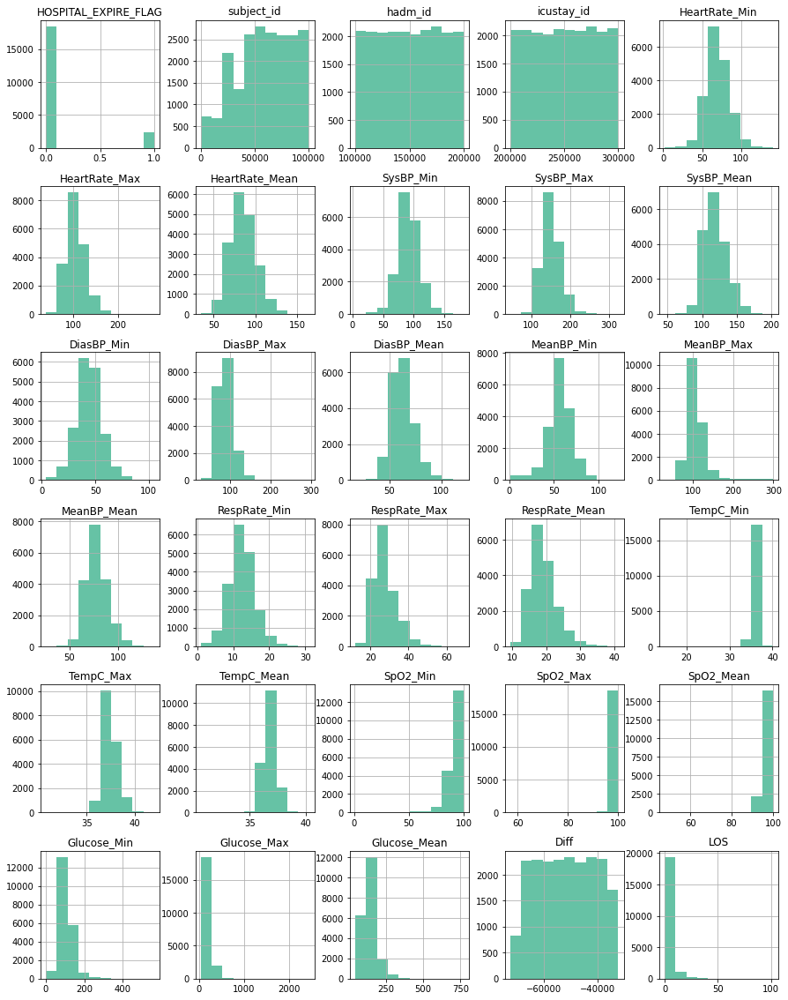

In [13]:
# plot histogram of each numerical columns to see their skewness visually
fig = plt.figure(figsize = (15,20))
ax = fig.gca()
numerical_columns.hist(ax = ax);

## Pre-processing

In [14]:
train_work=train_raw.copy()
test_work=test_raw.copy()

### Age

In [15]:
### create age variable

for df in [train_work, test_work]: 

    # create date format from DOB
    df["year_of_birth"]=pd.to_datetime(df["DOB"], format= "%Y-%m-%d")

    # add Diff variable to year_of_birth
    df["year_of_birth"]=df["year_of_birth"]+ pd.to_timedelta(df.Diff, unit="d")
    # get the year 
    df["year_of_birth"]=df["year_of_birth"].dt.strftime("%Y").astype(int)


    # create date format from admission time
    df["admission_year"]=pd.to_datetime(df["ADMITTIME"], format= "%Y-%m-%d")
    # add Diff variable 
    df["admission_year"]=df["admission_year"]+ pd.to_timedelta(df.Diff, unit="d")
    # get the year 
    df["admission_year"]=df["admission_year"].dt.strftime("%Y").astype(int)

    ### determine age
    df["age"]=df["admission_year"]-df["year_of_birth"]

In [16]:
# For patients who are older than 89 years old, we impute the values to be 90 years old. 
# https://github.com/MIT-LCP/mimic-code/issues/637
train_work['age'] = np.where(train_work['age']>89, 90,train_work['age'])
test_work['age'] = np.where(test_work['age']>89, 90, test_work['age'])

count    20885.000000
mean        64.206368
std         17.126828
min         15.000000
25%         53.000000
50%         66.000000
75%         78.000000
max         90.000000
Name: age, dtype: float64


/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


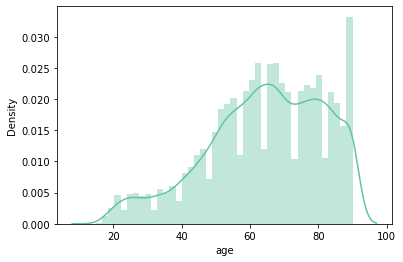

In [17]:
print(train_work["age"].describe())
sns.distplot(train_work["age"]);

### Ethnicity and religion

**Ethnicity**

In [18]:
train_work["ETHNICITY"].value_counts()

WHITE                                                       15112
BLACK/AFRICAN AMERICAN                                       1977
UNABLE TO OBTAIN                                              577
UNKNOWN/NOT SPECIFIED                                         568
HISPANIC OR LATINO                                            562
OTHER                                                         489
ASIAN                                                         265
PATIENT DECLINED TO ANSWER                                    175
HISPANIC/LATINO - PUERTO RICAN                                155
ASIAN - CHINESE                                               146
BLACK/CAPE VERDEAN                                            126
WHITE - RUSSIAN                                               117
BLACK/HAITIAN                                                  72
HISPANIC/LATINO - DOMINICAN                                    59
ASIAN - ASIAN INDIAN                                           58
WHITE - OT

In [19]:
test_work.ETHNICITY.value_counts()

WHITE                                                       3789
BLACK/AFRICAN AMERICAN                                       489
UNKNOWN/NOT SPECIFIED                                        154
HISPANIC OR LATINO                                           147
UNABLE TO OBTAIN                                             140
OTHER                                                        100
ASIAN                                                         58
PATIENT DECLINED TO ANSWER                                    58
ASIAN - CHINESE                                               41
HISPANIC/LATINO - PUERTO RICAN                                34
WHITE - RUSSIAN                                               28
BLACK/CAPE VERDEAN                                            19
BLACK/HAITIAN                                                 18
WHITE - OTHER EUROPEAN                                        18
PORTUGUESE                                                    17
ASIAN - ASIAN INDIAN     

In [20]:
### ethnicity groups: 
##  white, hispanic, asian, black, other, declined to answer/unknown/unable to obtain 

for df in [train_work, test_work]: 
    df['ETHNICITY_orig']=df['ETHNICITY'] # keep original column for safety 

    # create new grouped ethnicity categories 
    ethnicity_columns=["white", "hispanic", "asian", "black", "other"]
    ethnicity_groups=[e.upper() for e in ethnicity_columns]
    zip_iterator = zip(ethnicity_groups, ethnicity_columns) # Get pairs of elements.
    ethnicity_dictionary = dict(zip_iterator) # Convert to dictionary.

    for k, v in ethnicity_dictionary.items():
        df.loc[df['ETHNICITY'].str.startswith(k, na=False), 'ETHNICITY'] = v

    # create additional other and unknown categories from the remaining ones 
    df['ETHNICITY']=np.where((df['ETHNICITY']=="UNABLE TO OBTAIN")|
                             (df['ETHNICITY']=="UNKNOWN/NOT SPECIFIED")|
                             (df['ETHNICITY']=="PATIENT DECLINED TO ANSWER"), 
                              "unknown", df['ETHNICITY'])


    # put remaining categories into the 'other' category
    # remaining categories: all written in uppercase letter, so filter for those values 
    df['ETHNICITY']=np.where(df['ETHNICITY'].str.isupper(), "other", 
                                        df['ETHNICITY'])
    
    # drop original column
    df=df.drop(columns=['ETHNICITY_orig'])

/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='ETHNICITY', ylabel='count'>

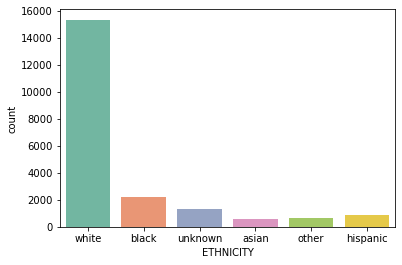

In [21]:
# look at the distribution of new groups
sns.countplot(train_work.ETHNICITY)

**Religion**

In [22]:
train_work.RELIGION.value_counts()

CATHOLIC                  7655
NOT SPECIFIED             5398
PROTESTANT QUAKER         2753
JEWISH                    1840
UNOBTAINABLE              1515
OTHER                      702
EPISCOPALIAN               288
GREEK ORTHODOX             178
CHRISTIAN SCIENTIST        164
BUDDHIST                   109
MUSLIM                      74
UNITARIAN-UNIVERSALIST      54
JEHOVAH'S WITNESS           45
ROMANIAN EAST. ORTH         41
HINDU                       38
7TH DAY ADVENTIST           30
HEBREW                       1
Name: RELIGION, dtype: int64

In [23]:
test_work.RELIGION.value_counts()

CATHOLIC                  1898
NOT SPECIFIED             1361
PROTESTANT QUAKER          697
JEWISH                     446
UNOBTAINABLE               395
OTHER                      182
EPISCOPALIAN                62
GREEK ORTHODOX              50
CHRISTIAN SCIENTIST         29
BUDDHIST                    25
MUSLIM                      17
JEHOVAH'S WITNESS           14
ROMANIAN EAST. ORTH         12
7TH DAY ADVENTIST           12
UNITARIAN-UNIVERSALIST      11
HINDU                       10
Name: RELIGION, dtype: int64

In [24]:
# expand OTHER category
religion_other=[
                "EPISCOPALIAN",                
                "GREEK ORTHODOX",              
                "CHRISTIAN SCIENTIST",         
                "BUDDHIST",                    
                "MUSLIM",                      
                "JEHOVAH'S WITNESS",           
                "ROMANIAN EAST. ORTH",         
                "7TH DAY ADVENTIST",           
                "UNITARIAN-UNIVERSALIST",      
                "HINDU"  
                ]
train_work["RELIGION"]=train_work["RELIGION"].replace(religion_other, "OTHER")
train_work["RELIGION"]=train_work["RELIGION"].replace(["NOT SPECIFIED", "HEBREW"], 
                                                         ["UNOBTAINABLE", "JEWISH"])
test_work["RELIGION"]=test_work["RELIGION"].replace(religion_other, "OTHER")
test_work["RELIGION"]=test_work["RELIGION"].replace(["NOT SPECIFIED", "HEBREW"], 
                                                         ["UNOBTAINABLE", "JEWISH"])

CATHOLIC             7655
UNOBTAINABLE         6913
PROTESTANT QUAKER    2753
JEWISH               1841
OTHER                1723
Name: RELIGION, dtype: int64


/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


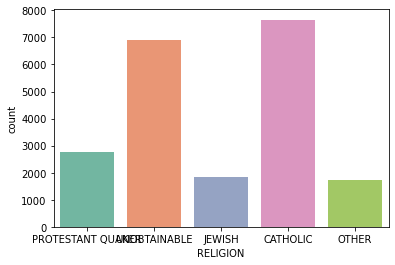

In [25]:
print(train_work.RELIGION.value_counts())
sns.countplot(train_work.RELIGION);

### Number of hospital stays

In [26]:
train_work[["subject_id", "hadm_id", "ADMITTIME"]].sort_values(["subject_id", "hadm_id"])[:10]

,subject_id,hadm_id,ADMITTIME
18310,23,124321,2157-10-18 19:34:00
17908,34,144319,2191-02-23 05:23:00
9591,36,165660,2134-05-10 11:30:00
727,85,112077,2167-07-25 18:49:00
4456,109,102024,2142-05-20 12:59:00
16404,109,113189,2142-02-14 10:42:00
4735,109,124398,2142-03-24 16:34:00
3958,109,124657,2142-01-14 17:34:00
1283,109,125288,2141-11-18 14:00:00
8222,109,126055,2141-10-13 23:10:00


In [27]:
# merge with train and test data
train_work["nr_stays"] = train_work.sort_values(['subject_id', 'hadm_id']).groupby(["subject_id"]).cumcount() + 1
test_work["nr_stays"] = test_work.sort_values(['subject_id', 'hadm_id']).groupby(["subject_id"]).cumcount() + 1

<AxesSubplot:xlabel='nr_stays', ylabel='Count'>

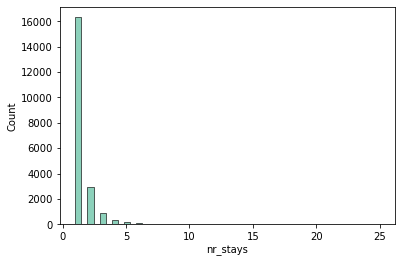

In [28]:
sns.histplot(train_work.nr_stays, bins=50)

### Comorbidities

#### Number of comorbidites

In [29]:
diagnosis_number=diagnosis_df.groupby(["subject_id", "hadm_id"]).max().reset_index().drop(columns="icd9_code")
diagnosis_number=diagnosis_number.rename(columns={"seq_num":"diagnosis_nr"})
diagnosis_number.head()

/var/folders/hc/qzy2rzvj5cg38v_607m73p640000gn/T/ipykernel_8426/1072887780.py:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  diagnosis_number=diagnosis_df.groupby(["subject_id", "hadm_id"]).max().reset_index().drop(columns="icd9_code")


,subject_id,hadm_id,diagnosis_nr
0,2,163353,3.0
1,3,145834,9.0
2,4,185777,9.0
3,5,178980,3.0
4,6,107064,8.0


/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


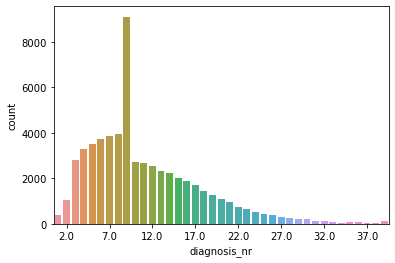

In [30]:
sns.countplot(diagnosis_number["diagnosis_nr"]);
plt.xticks(np.arange(1, 40, 5.0));

In [31]:
# merge with train and test data
train_work=pd.merge(train_work, diagnosis_number, on=["subject_id", "hadm_id"])
test_work=pd.merge(test_work, diagnosis_number, on=["subject_id", "hadm_id"])

### Include average length of staying in a hospital by diagnosis group and hospital stay



#### Classify ICD9 codes into larger categories 

These are 3 digit numbers but I can apply them on this data, because the first three digits determine the group of the disease so that I can classify them into larger groups according to this list. 

**My strategy:** 
1. encode the icd9 codes into larger categories for each patient. 
2. create a wide dataset, where the columns are the new diagnosis categories
3. within the larger categories count how many "sub-diagnoses" each patient has


In [32]:
# drop long diagnose column
diagnosis_groups=diagnosis_df.drop(columns="long_diagnose")

Based on the major categories I need the first 3 numbers of the icd9 code, or the first 4 if it starts with V or E. 
But I can also just cut off the last two characters so that I end up either 3 digit codes or V/E+3 digit codes. 
But after I have to deal with them as numeric variables and having string values in the column would mess up my function which converts codes to larger textual diganoses. 

In [33]:
# cut off first 3 digits from icd9 column, except if the observation starts with an E or a V, then the first 4
# create new column for icd9 grouping, replace rows with 0 if starts with V or E (= not all elements of the cell are digits )
diagnosis_groups['icd9_groups_nums'] = np.where((diagnosis_groups['icd9_code'].str.isdigit()==True),
                                           diagnosis_groups["icd9_code"].str[:3], 0)


In [34]:
# convert new column to integers, to be able to filter them according to their classification numbers
diagnosis_groups["icd9_groups_nums"]=diagnosis_groups["icd9_groups_nums"].astype(int)

In [35]:
# apply my remap function, which is based on the classification of the icd9 codes
diagnosis_groups["icd9_groups"]=list(diagnosis_groups["icd9_groups_nums"].map(remap_icd9_codes))

# drop icd9_groups_nums column because it is no longer needed
diagnosis_groups=diagnosis_groups.drop(columns=["icd9_groups_nums"])

In [36]:
# check results
diagnosis_groups.head(10)

,subject_id,hadm_id,seq_num,icd9_code,icd9_groups
0,256,108811,1.0,53240,diseases of the digestive system
1,256,108811,2.0,41071,diseases of the circulatory system
2,256,108811,3.0,53560,diseases of the digestive system
3,256,108811,4.0,40390,diseases of the circulatory system
4,256,108811,5.0,5859,diseases of the genitourinary system
5,256,108811,6.0,04186,infectious and parasitic diseases
6,256,108811,7.0,41401,diseases of the circulatory system
7,256,108811,8.0,2724,"endocrine, nutritional and metabolic diseases,..."
8,256,108811,9.0,496,diseases of the respiratory system
9,256,108811,10.0,42731,diseases of the circulatory system


From this table we can see that for the same patient (subject_id) their same hospital stay (hadm_id) the icd9 group variable can be the same.

As a consequence I will reshape the data into wide format with the different icd9 groups as columns and the number of diagnoses for each patient by icd9 category as values of these columns.

In [37]:
# count the number of unique diagnoses by patient, icd9 group and hospital stay
d_count=diagnosis_groups.groupby(["subject_id", "icd9_groups", "hadm_id"])["icd9_groups"].agg(["count"]).reset_index()

# reshape from long to wide
d_wide=d_count.pivot(index=['subject_id',"hadm_id"], columns=[ 'icd9_groups'], values='count').reset_index()


# fill NAs with 0
d_wide=d_wide.fillna(0)

# check results
d_wide.head(10)

icd9_groups,subject_id,hadm_id,certain conditions originating in the perinatal period,"complications of pregnancy, childbirth, and the puerperium",congenital anomalies,diseases of the blood and blood-forming organs,diseases of the circulatory system,diseases of the digestive system,diseases of the genitourinary system,diseases of the musculoskeletal system and connective tissue,diseases of the nervous system and sense organs,diseases of the respiratory system,diseases of the skin and subcutaneous tissue,"endocrine, nutritional and metabolic diseases, and immunity disorders",external causes of injury and supplemental classification,infectious and parasitic diseases,injury and poisoning,mental disorders,neoplasms,"symptoms, signs, and ill-defined conditions"
0,2,163353,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0
1,3,145834,0.0,0.0,0.0,0.0,4.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
2,4,185777,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,3.0,0.0,0.0,0.0,2.0
3,5,178980,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0
4,6,107064,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,1.0,0.0,0.0,0.0
5,7,118037,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0
6,8,159514,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0
7,9,150750,0.0,0.0,0.0,0.0,3.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
8,10,184167,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
9,11,194540,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [38]:
# merge with original dataframe
train_work=pd.merge(train_work,d_wide, on=["subject_id", "hadm_id"])
train_work.shape

(20885, 65)

In [39]:
# merge with test dataframe
test_work=pd.merge(test_work,d_wide, on=["subject_id", "hadm_id"])
test_work.shape

(5221, 63)

In [40]:
# merge diagnoses df with the train dataset's LOS column and calculate expected length of staying
expected_los=pd.merge(diagnosis_groups, train_work[["subject_id","LOS"]])
expected_los=expected_los.groupby("icd9_groups").agg({"LOS":"mean"}).reset_index().sort_values(by="LOS", 
                                                                                                   ascending=False)
expected_los=expected_los.rename(columns={"LOS":"los_mean"})


# merge with d_count and multiply the number of diagnosis groups each person has per hospital stay
expected_los_w=pd.merge(d_count, expected_los, on=["icd9_groups"])
expected_los_w["exp_los"]=expected_los_w["los_mean"]*expected_los_w["count"]

# reshape from long to wide and fill NAs with 0
expected_los_w=expected_los_w.pivot(index=['subject_id', "hadm_id"], columns=[ 'icd9_groups'], 
                                  values='exp_los').reset_index().fillna(0)

# add prefix to column names
expected_los_w=expected_los_w.add_prefix("exp_")
expected_los_w=expected_los_w.rename(columns={"exp_subject_id":"subject_id", 
                                           "exp_hadm_id":"hadm_id"})
expected_los_w.head()


icd9_groups,subject_id,hadm_id,exp_certain conditions originating in the perinatal period,"exp_complications of pregnancy, childbirth, and the puerperium",exp_congenital anomalies,exp_diseases of the blood and blood-forming organs,exp_diseases of the circulatory system,exp_diseases of the digestive system,exp_diseases of the genitourinary system,exp_diseases of the musculoskeletal system and connective tissue,exp_diseases of the nervous system and sense organs,exp_diseases of the respiratory system,exp_diseases of the skin and subcutaneous tissue,"exp_endocrine, nutritional and metabolic diseases, and immunity disorders",exp_external causes of injury and supplemental classification,exp_infectious and parasitic diseases,exp_injury and poisoning,exp_mental disorders,exp_neoplasms,"exp_symptoms, signs, and ill-defined conditions"
0,2,163353,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.000000,0.000000,12.422584,0.000000,0.000000,0.0,0.0,0.000000
1,3,145834,0.0,0.0,0.0,0.000000,16.066137,0.00000,4.120997,0.0,0.0,0.0,5.099428,4.106132,0.000000,4.964069,0.000000,0.0,0.0,4.331270
2,4,185777,0.0,0.0,0.0,0.000000,0.000000,4.28915,0.000000,0.0,0.0,0.0,0.000000,4.106132,8.281723,14.892206,0.000000,0.0,0.0,8.662539
3,5,178980,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.000000,0.000000,12.422584,0.000000,0.000000,0.0,0.0,0.000000
4,6,107064,0.0,0.0,0.0,4.091317,8.033068,0.00000,0.000000,0.0,0.0,0.0,0.000000,12.318395,4.140861,0.000000,5.080029,0.0,0.0,0.000000


In [41]:
# merge with train and test df
train_work=pd.merge(train_work, expected_los_w, on=["subject_id", "hadm_id"])
train_work.shape

(20885, 83)

In [42]:
# merge with test data
test_work=pd.merge(test_work, expected_los_w, on=["subject_id", "hadm_id"])

In [43]:
test_work.shape, train_work.shape

((5221, 81), (20885, 83))

#### Include a dummy for the top 5 diagnosis groups with the longest hospital stay on average

Which basically means that I am keeping the mean LOS variables that were created when I classified the ICD9 diagnoses into larger groups.

Text(0.5, 1.0, 'Top 10 diagnosis groups with the longest hospital stay')

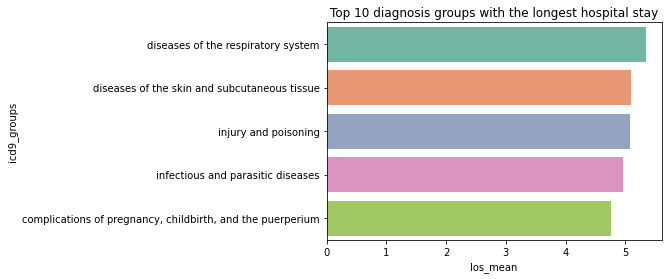

In [44]:
# Visualize probability of dying by icd9 groups
expected_los=expected_los.sort_values(by="los_mean", ascending=False)
sns.barplot(x="los_mean",y="icd9_groups", data=expected_los.head(5))
plt.title("Top 10 diagnosis groups with the longest hospital stay")


In [45]:
# selected the top 5 columns and drop the remaining binary icd9 group columns
top_los=list(expected_los.head(5).icd9_groups.values)
top_los

['diseases of the respiratory system',
 'diseases of the skin and subcutaneous tissue',
 'injury and poisoning',
 'infectious and parasitic diseases',
 'complications of pregnancy, childbirth, and the puerperium']

In [46]:
# list of all the diagnosis groups
all_diagnosis_group_columns=['certain conditions originating in the perinatal period',
       'complications of pregnancy, childbirth, and the puerperium',
       'congenital anomalies',
       'diseases of the blood and blood-forming organs',
       'diseases of the circulatory system',
       'diseases of the digestive system',
       'diseases of the genitourinary system',
       'diseases of the musculoskeletal system and connective tissue',
       'diseases of the nervous system and sense organs',
       'diseases of the respiratory system',
       'diseases of the skin and subcutaneous tissue',
       'endocrine, nutritional and metabolic diseases, and immunity disorders',
       'external causes of injury and supplemental classification',
       'infectious and parasitic diseases', 'injury and poisoning',
       'mental disorders', 'neoplasms',
       'symptoms, signs, and ill-defined conditions']

In [47]:
# the columns that I need to drop
cols_to_drop=list(set(all_diagnosis_group_columns)-set(top_los))
cols_to_drop

['neoplasms',
 'diseases of the digestive system',
 'mental disorders',
 'external causes of injury and supplemental classification',
 'diseases of the genitourinary system',
 'symptoms, signs, and ill-defined conditions',
 'congenital anomalies',
 'diseases of the musculoskeletal system and connective tissue',
 'diseases of the blood and blood-forming organs',
 'certain conditions originating in the perinatal period',
 'diseases of the nervous system and sense organs',
 'endocrine, nutritional and metabolic diseases, and immunity disorders',
 'diseases of the circulatory system']

In [48]:
# drop columns
train_work=train_work.drop(columns=cols_to_drop)
test_work=test_work.drop(columns=cols_to_drop)

### Missing values

#### Marital status

In [49]:
train_work.isnull().sum()

HOSPITAL_EXPIRE_FLAG                                  0
subject_id                                            0
hadm_id                                               0
icustay_id                                            0
HeartRate_Min                                      2187
                                                   ... 
exp_infectious and parasitic diseases                 0
exp_injury and poisoning                              0
exp_mental disorders                                  0
exp_neoplasms                                         0
exp_symptoms, signs, and ill-defined conditions       0
Length: 70, dtype: int64

In [50]:
print(train_work["MARITAL_STATUS"].unique())
train_work["MARITAL_STATUS"].value_counts()

['SINGLE' 'MARRIED' 'SEPARATED' 'WIDOWED' 'DIVORCED' nan
 'UNKNOWN (DEFAULT)' 'LIFE PARTNER']


MARRIED              9664
SINGLE               5910
WIDOWED              2819
DIVORCED             1413
SEPARATED             240
UNKNOWN (DEFAULT)     103
LIFE PARTNER           14
Name: MARITAL_STATUS, dtype: int64

In [51]:
# the best if I fill the missing values with the category Unknown 
for df in [train_work, test_work]:
    df["MARITAL_STATUS"]= df["MARITAL_STATUS"].fillna("UNKNOWN (DEFAULT)")

#### Forward/backward fill

I am going to use the method that was showed on class to fill missing data: use repeat visits to forward and backward fill missing values. 

In [52]:
train_work = train_work.groupby(['subject_id'], as_index = False).apply(lambda group: group.ffill())
test_work = test_work.groupby(['subject_id'], as_index = False).apply(lambda group: group.ffill())

In [53]:
train_work = train_work.groupby(['subject_id'], as_index = False).apply(lambda group: group.bfill())
test_work = test_work.groupby(['subject_id'], as_index = False).apply(lambda group: group.bfill())

In [54]:
# Checking for NAs - train
train_work.isnull().sum()

HOSPITAL_EXPIRE_FLAG                                  0
subject_id                                            0
hadm_id                                               0
icustay_id                                            0
HeartRate_Min                                      1787
                                                   ... 
exp_infectious and parasitic diseases                 0
exp_injury and poisoning                              0
exp_mental disorders                                  0
exp_neoplasms                                         0
exp_symptoms, signs, and ill-defined conditions       0
Length: 70, dtype: int64

## Preprocessing pipeline

I will use the `ColumnTransformer` to allow for different data preprocessing for different types of columns

- Numerical values - `ColumnTransformer` and `KNNImputer()`
- Categoricals (not ICD9) - `OneHotEncoder()` and `StandardScaler()`
- ICD9 -  `StandardScaler()`
    - target encoding has been done before manually 

In [55]:
train_final=train_work.copy()
test_final=test_work.copy()

In [56]:
train_final.columns

Index(['HOSPITAL_EXPIRE_FLAG', 'subject_id', 'hadm_id', 'icustay_id',
       'HeartRate_Min', 'HeartRate_Max', 'HeartRate_Mean', 'SysBP_Min',
       'SysBP_Max', 'SysBP_Mean', 'DiasBP_Min', 'DiasBP_Max', 'DiasBP_Mean',
       'MeanBP_Min', 'MeanBP_Max', 'MeanBP_Mean', 'RespRate_Min',
       'RespRate_Max', 'RespRate_Mean', 'TempC_Min', 'TempC_Max', 'TempC_Mean',
       'SpO2_Min', 'SpO2_Max', 'SpO2_Mean', 'Glucose_Min', 'Glucose_Max',
       'Glucose_Mean', 'GENDER', 'DOB', 'ADMITTIME', 'Diff', 'ADMISSION_TYPE',
       'INSURANCE', 'RELIGION', 'MARITAL_STATUS', 'ETHNICITY', 'DIAGNOSIS',
       'ICD9_diagnosis', 'FIRST_CAREUNIT', 'LOS', 'year_of_birth',
       'admission_year', 'age', 'ETHNICITY_orig', 'nr_stays', 'diagnosis_nr',
       'complications of pregnancy, childbirth, and the puerperium',
       'diseases of the respiratory system',
       'diseases of the skin and subcutaneous tissue',
       'infectious and parasitic diseases', 'injury and poisoning',
       'exp_certain cond

In [57]:
# drop unnecessary columns
X_train = train_final.drop(['HOSPITAL_EXPIRE_FLAG','subject_id', 'hadm_id', 'icustay_id',
                           'DOB', 'ADMITTIME', 'Diff', 'DIAGNOSIS',
                          'LOS', 'year_of_birth','admission_year', 'ETHNICITY_orig'], axis = 1)
Y_train=train_final["LOS"]

In [58]:
# select numerical columns
X_train.select_dtypes(exclude=["object", "category"]).columns

Index(['HeartRate_Min', 'HeartRate_Max', 'HeartRate_Mean', 'SysBP_Min',
       'SysBP_Max', 'SysBP_Mean', 'DiasBP_Min', 'DiasBP_Max', 'DiasBP_Mean',
       'MeanBP_Min', 'MeanBP_Max', 'MeanBP_Mean', 'RespRate_Min',
       'RespRate_Max', 'RespRate_Mean', 'TempC_Min', 'TempC_Max', 'TempC_Mean',
       'SpO2_Min', 'SpO2_Max', 'SpO2_Mean', 'Glucose_Min', 'Glucose_Max',
       'Glucose_Mean', 'age', 'nr_stays', 'diagnosis_nr',
       'complications of pregnancy, childbirth, and the puerperium',
       'diseases of the respiratory system',
       'diseases of the skin and subcutaneous tissue',
       'infectious and parasitic diseases', 'injury and poisoning',
       'exp_certain conditions originating in the perinatal period',
       'exp_complications of pregnancy, childbirth, and the puerperium',
       'exp_congenital anomalies',
       'exp_diseases of the blood and blood-forming organs',
       'exp_diseases of the circulatory system',
       'exp_diseases of the digestive system',
  

In [59]:
# select categorical columns
X_train.select_dtypes(include=["object", "category"]).columns

Index(['GENDER', 'ADMISSION_TYPE', 'INSURANCE', 'RELIGION', 'MARITAL_STATUS',
       'ETHNICITY', 'ICD9_diagnosis', 'FIRST_CAREUNIT'],
      dtype='object')

In [60]:
## create lists of features:
# numerical
numerical_feat=X_train.select_dtypes(exclude=["object", "category"]).columns

# categorical
categorical_feat=X_train.select_dtypes(include=["object", "category"]).columns
categorical_feat=categorical_feat.drop(["ICD9_diagnosis"])

In [61]:
# Build the pipeline
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, RobustScaler, OneHotEncoder 
from sklearn.impute import KNNImputer



# pipeline for numerical data
num_preprocessing = Pipeline(
    steps=[("cont_scaler", RobustScaler()),
    ("cont_imputer_KNN",KNNImputer())]    
    )

# pipeline for categorical data
cat_preprocessing = Pipeline([
    ("cat_encoder",OneHotEncoder(handle_unknown="ignore", sparse=False)),
    ("cat_scaler", StandardScaler())])


# combine preprocessing pipelines using a columnTransformer
preprocessor = ColumnTransformer(transformers=
    [("num", num_preprocessing, numerical_feat),
     ("cat", cat_preprocessing, categorical_feat)
     ]
    #,remainder='passthrough'
    , remainder='drop'
)

In [62]:
from sklearn import set_config
set_config(display="diagram")
preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('cont_scaler',
                                                  RobustScaler()),
                                                 ('cont_imputer_KNN',
                                                  KNNImputer())]),
                                 Index(['HeartRate_Min', 'HeartRate_Max', 'HeartRate_Mean', 'SysBP_Min',
       'SysBP_Max', 'SysBP_Mean', 'DiasBP_Min', 'DiasBP_Max', 'DiasBP_Mean',
       'MeanBP_Min', 'MeanBP_Max', 'MeanBP_Mean', 'RespRate_Min',
       'RespRate_Max', 'RespRate_Mean', 'TempC_Mi...
       'exp_infectious and parasitic diseases', 'exp_injury and poisoning',
       'exp_mental disorders', 'exp_neoplasms',
       'exp_symptoms, signs, and ill-defined conditions'],
      dtype='object')),
                                ('cat',
                                 Pipeline(steps=[('cat_encoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False)),
                                                 ('cat_scaler',
                                                  StandardScaler())]),
                                 Index(['GENDER', 'ADMISSION_TYPE', 'INSURANCE', 'RELIGION', 'MARITAL_STATUS',
       'ETHNICITY', 'FIRST_CAREUNIT'],
      dtype='object'))])

In [171]:
# This was used to test how the preprocessor works and whether it works properly
# preprocessor.fit(X_train, y_train)
# X_train_pp = preprocessor.transform(X_train)

# X_train_pp.shape

## Decision Tree model pipeline

In [63]:
# set up a grid search for a Decision Tree model
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
from imblearn.pipeline import Pipeline as imbPipe


from sklearn.tree import DecisionTreeRegressor

dt_estimator = DecisionTreeRegressor() 

dt_pipe=imbPipe([("preprocessor", preprocessor), 
                     ("model", dt_estimator)])

# parameters to do the gridsearch on
grid_values=[{'preprocessor__num__cont_imputer_KNN__n_neighbors':[10, 50, 100],
             'model__max_features':range(4,10),
             "model__max_depth": range(3,6),
             "model__min_samples_leaf":range(5,10),
              "model__random_state":[42]
             
             }]

In [64]:
# GridSearch
# use HalvingGridSearch instead of the simple grid search 

from sklearn.experimental import enable_halving_search_cv 
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.metrics import  r2_score, mean_squared_error

grid_DT = HalvingGridSearchCV(dt_pipe, grid_values, scoring='neg_mean_squared_error', cv=5,
                              error_score='raise', n_jobs=4, verbose=0)

In [65]:
# split up the original train dataset to test and train 
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(
     X_train, Y_train, test_size=0.2, random_state=42)

In [66]:
grid_DT.fit(x_train,y_train)

HalvingGridSearchCV(error_score='raise',
                    estimator=Pipeline(steps=[('preprocessor',
                                               ColumnTransformer(transformers=[('num',
                                                                                Pipeline(steps=[('cont_scaler',
                                                                                                 RobustScaler()),
                                                                                                ('cont_imputer_KNN',
                                                                                                 KNNImputer())]),
                                                                                Index(['HeartRate_Min', 'HeartRate_Max', 'HeartRate_Mean', 'SysBP_Min',
       'SysBP_Max', 'SysBP_Mean', 'DiasBP_Min', 'DiasBP_Max', 'DiasBP_Mean',
       'MeanBP_Min',...
                                                                                Index(['GENDER', 'ADMISSION_TYPE', 'INSURANCE', 'RELIGION', 'MARITAL_STATUS',
       'ETHNICITY', 'FIRST_CAREUNIT'],
      dtype='object'))])),
                                              ('model',
                                               DecisionTreeRegressor())]),
                    n_jobs=4,
                    param_grid=[{'model__max_depth': range(3, 6),
                                 'model__max_features': range(4, 10),
                                 'model__min_samples_leaf': range(5, 10),
                                 'model__random_state': [42],
                                 'preprocessor__num__cont_imputer_KNN__n_neighbors': [10,
                                                                                      50,
                                                                                      100]}],
                    scoring='neg_mean_squared_error')

In [67]:
print("Best parameter (CV score=%0.3f):" % grid_DT.best_score_)
print("Best estimator: ", grid_DT.best_params_)

Best parameter (CV score=-23.081):
Best estimator:  {'model__max_depth': 4, 'model__max_features': 4, 'model__min_samples_leaf': 9, 'model__random_state': 42, 'preprocessor__num__cont_imputer_KNN__n_neighbors': 100}


In [94]:
# save score
scores_all=dict()
scores_all={"DT: ": 23.081}

In [160]:
# save model
# os.chdir(project_dir)
# filename = 'DT_trial_4_woicd9.sav'
# pickle.dump(grid_DT, open(filename, 'wb'))

In [89]:
# evaluate the model  
y_test_pred=grid_DT.predict(x_test)
y_train_pred=grid_DT.predict(x_train)

print("Mean Squared Error on the train data: ", mean_squared_error(y_train, y_train_pred))
print("Mean Squared Error on the test data: ", mean_squared_error(y_test, y_test_pred))

print("R-squared on the train data: ", R_squared(y_train, y_train_pred))
print("R squared on the test data: ", R_squared(y_test, y_test_pred))

Mean Squared Error on the train data:  24.308813372398113
Mean Squared Error on the test data:  24.311136158429758
R-squared on the train data:  0.09194736176410623
R squared on the test data:  0.09464369515280822


In [163]:
# Produce .csv for kaggle testing from the actual test set
# test=test_work.drop(['subject_id', 'hadm_id', 'icustay_id',
#                     'DOB', 'ADMITTIME', 'Diff','year_of_birth', 'admission_year', 
#                      ], axis=1)
# y_test_pred=grid_DT.predict(test)
# test_predictions_submit = pd.DataFrame({"icustay_id": test_work["icustay_id"], 
#                                         "LOS": y_test_pred})
# test_predictions_submit.to_csv("test_predictions_submit.csv", index = False)

## Try other tree-type methods

In [91]:
SEED=42

In [92]:
X = train_final.drop(['HOSPITAL_EXPIRE_FLAG','subject_id', 'hadm_id', 'icustay_id',
                           'DOB', 'ADMITTIME', 'Diff', 'DIAGNOSIS',"ICD9_diagnosis",
                          'LOS', 'year_of_birth','admission_year', 'ETHNICITY_orig'], axis = 1)
Y = train_final["LOS"]

In [93]:
# preprocess data
preprocessor.fit(X, Y)
X_pp = preprocessor.transform(X)

In [94]:
x_train, x_test, y_train, y_test = train_test_split(X_pp, Y, test_size=0.2, random_state = SEED)

In [79]:
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error

In [99]:
#%% THIS TAKES A LOT OF TIME TO RUN: Wall time: 16h 7min 12s

%%time

# models
models = [XGBRegressor(),
          RandomForestRegressor(),
          AdaBoostRegressor(),
          GradientBoostingRegressor()]

               

# models parameters
xgb_params = {'objective':['reg:squarederror'],
                  'learning_rate': [0.05,0.1,0.01,0.5, 1],
                  'max_depth': range(3, 10),
                  'min_child_weight': range(1, 8),
                  'reg_lambda':[1.5],
                  'n_estimators': [50, 100, 130, 200],
                  'seed': [SEED]}


randomforest_params = {'max_features': range(4, 10),
                  'n_estimators': [50, 100, 200,500,1000,5000],
                  'max_depth': range(3, 30,3),
                  'min_samples_leaf': range(5, 10),
                'bootstrap' : [True, False],
                  'random_state': [SEED]}

adab_params = {'learning_rate': [0.001, 0.01, 0.1, 1.0],
                'n_estimators': [10, 50, 100, 500, 1000],
                'loss':['linear', 'square'],               
                'random_state': [SEED]}

gb_params = {'learning_rate': [0.05, 1],
            'n_estimators': [50, 100],
            'max_depth': range(3, 16, 2),
            'max_features': range(4, 20,2),
            'min_samples_split':range(200,2001,400),
             'min_samples_leaf':range(30,71,10),
            'random_state': [SEED]}

params = [xgb_params, 
         randomforest_params, 
         adab_params, 
         gb_params]

names = ['XGB_Regressor', 
        'RandomForest_Regressor', 
        'AdaBoost_Regressor',
        'GradientBoosting_Regressor']
scores = {}

# gridsearch
for i, model in enumerate(models):
    print(f"Grid-Searching for model {names[i]}...")
    best_model = HalvingGridSearchCV(model, params[i], n_jobs=4, cv=5, 
                              scoring='neg_mean_squared_error', verbose = 0)
    best_model.fit(x_train, y_train)
    print(f"Best model fitted")
    y_hat = best_model.predict(x_test)
    
    mse = mean_squared_error(y_test, y_hat)
    #assign the best parameters to my models
    models[i].set_params(**best_model.best_params_)
    
    #print scores (on log parcelvalue)
    scores[names[i]] = (best_model.best_estimator_, mse)
    print(f'{names[i]} chosen hyperparameters: {best_model.best_params_}')
    print(f'{names[i]} MSE score on train sample: {-best_model.best_score_}')
    print(f'{names[i]} MSE score on test sample: {mse}\n')

Grid-Searching for model XGB_Regressor...
Best model fitted
XGB_Regressor chosen hyperparameters: {'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'objective': 'reg:squarederror', 'reg_lambda': 1.5, 'seed': 42}
XGB_Regressor MSE score on train sample: 19.8806170099686
XGB_Regressor MSE score on test sample: 19.966337020188345

Grid-Searching for model RandomForest_Regressor...
Best model fitted
RandomForest_Regressor chosen hyperparameters: {'bootstrap': False, 'max_depth': 21, 'max_features': 9, 'min_samples_leaf': 8, 'n_estimators': 5000, 'random_state': 42}
RandomForest_Regressor MSE score on train sample: 20.69542189453467
RandomForest_Regressor MSE score on test sample: 19.47389472685102

Grid-Searching for model AdaBoost_Regressor...
Best model fitted
AdaBoost_Regressor chosen hyperparameters: {'learning_rate': 0.001, 'loss': 'linear', 'n_estimators': 100, 'random_state': 42}
AdaBoost_Regressor MSE score on train sample: 21.904188565040894
AdaBo

RandomForest_Regressor chosen hyperparameters: {'bootstrap': True, 'max_depth': 24, 'max_features': 'auto', 'min_samples_leaf': 9, 'min_samples_split': 10, 'n_estimators': 200, 'random_state': 42}

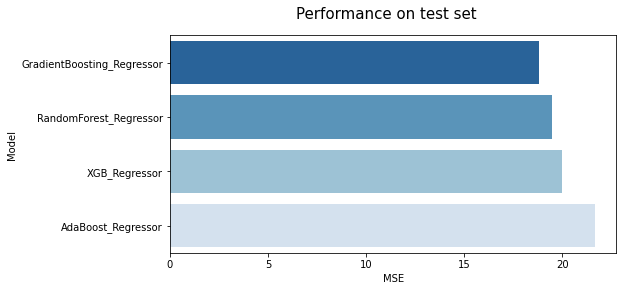

In [100]:
ranking = pd.DataFrame.from_dict(scores, orient='index').reset_index()

ranking.columns = ['Model', 'Setting', 'MSE']
ranking = ranking.sort_values(by='MSE', ascending=True).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(8, 4))
fig.suptitle("Performance on test set", fontsize=15)
sns.barplot(x="MSE", y="Model", data=ranking, ax=ax);

In [95]:
# store their scores
scores_all.update({"XGB":19.966,
                  "RandomForest":19.473,
                  "AdaBoost":21.66,
                  "GradientBoosting":18.807})

In [101]:
# fit best model
best_model = ranking.Setting[0].fit(X_pp,Y)

In [176]:
test=test_final.drop(['subject_id', 'hadm_id', 'icustay_id',
                    'DOB', 'ADMITTIME', 'Diff','year_of_birth', 'admission_year', "ICD9_diagnosis"
                     ], axis=1)


X_test_pp = preprocessor.transform(test_final)

In [177]:
y_test_pred=best_model.predict(X_test_pp)

In [178]:
# Produce .csv for kaggle testing from the actual test set
# test_predictions_submit = pd.DataFrame({"icustay_id": test_final["icustay_id"], 
#                                         "LOS": y_test_pred})
# test_predictions_submit.to_csv("test_predictions_submit.csv", index = False)

## Try ensembling techniques

In [76]:
from sklearn.model_selection import ParameterGrid
from sklearn.ensemble import BaggingRegressor

### Stack predictors

In this strategy, some estimators are individually fitted on some training data while a final estimator is trained using the stacked predictions of these base estimators.

In [67]:
# from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor, BaggingRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error

In [71]:
# combine 3 learners (linear and non-linear) and use a ridge regressor to combine their outputs together

# create pipelines 
hgb_pipeline=make_pipeline(preprocessor, HistGradientBoostingRegressor())
rf_pipeline=make_pipeline(preprocessor, RandomForestRegressor())
gbdt_pipeline = make_pipeline(
    preprocessor, HistGradientBoostingRegressor(random_state=0)
)

from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import RidgeCV

# combine
estimators = [
    ("Random Forest", rf_pipeline),
    ("Hist Gradient Boosting", hgb_pipeline),
    ("Gradien Boosting", gbdt_pipeline),
]

stacking_regressor = StackingRegressor(estimators=estimators, 
                                       final_estimator=RidgeCV())
stacking_regressor

StackingRegressor(estimators=[('Random Forest',
                               Pipeline(steps=[('columntransformer',
                                                ColumnTransformer(transformers=[('num',
                                                                                 Pipeline(steps=[('cont_scaler',
                                                                                                  RobustScaler()),
                                                                                                 ('cont_imputer_KNN',
                                                                                                  KNNImputer())]),
                                                                                 Index(['HeartRate_Min', 'HeartRate_Max', 'HeartRate_Mean', 'SysBP_Min',
       'SysBP_Max', 'SysBP_Mean', 'DiasBP_Min', 'DiasBP_Max', 'DiasBP_Mean',
       'MeanBP_Min'...
                                                                                 Pipeline(steps=[('cat_encoder',
                                                                                                  OneHotEncoder(handle_unknown='ignore',
                                                                                                                sparse=False)),
                                                                                                 ('cat_scaler',
                                                                                                  StandardScaler())]),
                                                                                 Index(['GENDER', 'ADMISSION_TYPE', 'INSURANCE', 'RELIGION', 'MARITAL_STATUS',
       'ETHNICITY', 'FIRST_CAREUNIT'],
      dtype='object'))])),
                                               ('histgradientboostingregressor',
                                                HistGradientBoostingRegressor(random_state=0))]))],
                  final_estimator=RidgeCV(alphas=array([ 0.1,  1. , 10. ])))

In [67]:
# prepare data to train and predict
X = train_final.drop(['HOSPITAL_EXPIRE_FLAG','subject_id', 'hadm_id', 'icustay_id',
                           'DOB', 'ADMITTIME', 'Diff', 'DIAGNOSIS',
                          'LOS', 'year_of_birth','admission_year', 'ETHNICITY_orig'], axis = 1)
Y=train_final["LOS"]


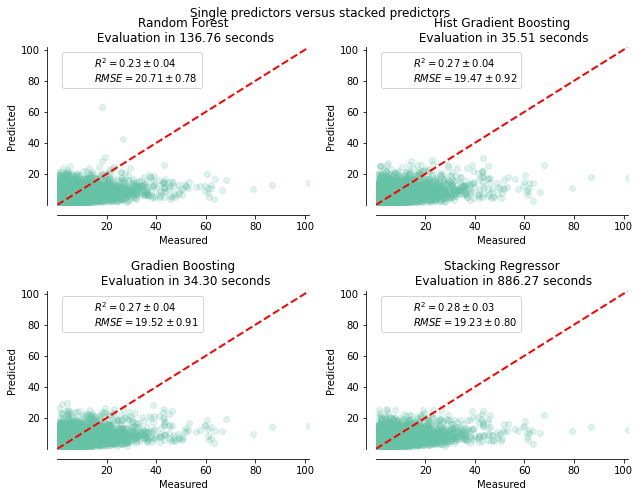

In [68]:
# The function plot_regression_results is used to plot the predicted and true targets.
import time
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_validate, cross_val_predict


fig, axs = plt.subplots(2, 2, figsize=(9, 7))
axs = np.ravel(axs)

for ax, (name, est) in zip(
    axs, estimators + [("Stacking Regressor", stacking_regressor)]
):
    start_time = time.time()
    score = cross_validate(
        est, X, Y, scoring=["r2", "neg_mean_squared_error"], n_jobs=2, verbose=0, error_score="raise"
    )
    elapsed_time = time.time() - start_time

    y_pred = cross_val_predict(est, X, Y, n_jobs=2, verbose=0)
    
    plot_regression_results(
        ax,
        Y,
        y_pred,
        name,
        (r"$R^2={:.2f} \pm {:.2f}$" + "\n" + r"$RMSE={:.2f} \pm {:.2f}$").format(
            np.mean(score["test_r2"]),
            np.std(score["test_r2"]),
            -np.mean(score["test_neg_mean_squared_error"]),
            np.std(score["test_neg_mean_squared_error"]),
        ),
        elapsed_time,
    )

plt.suptitle("Single predictors versus stacked predictors")
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

In [97]:
scores_all.update({"Stacking Regressors": 19.23})

#### Stacked Regression and GridSearch

In [191]:
from sklearn.ensemble import ExtraTreesRegressor

In [246]:
# Initializing models

hgb=HistGradientBoostingRegressor()
rf=RandomForestRegressor()
extratree=ExtraTreesRegressor()
ridge=RidgeCV()

regressors = [hgb, rf, extratree]
stregr = StackingRegressor(estimators=regressors, 
                           final_estimator=ridge)

params = {'hgb__learning_rate': [0.1, 1.0, 0.001,0.01],
          'hgb__max_depth':range(3, 30,3),
          'extratree__n_estimators': [50,75,100,125],
          'extratree__max_features': range(50,201,50),
          'extratree__min_samples_leaf': range(5,50,10),
          'extratree__min_samples_split': range(15,36,5),
          'rf__n_estimators': [50, 100, 200,500],
          'rf__max_depth': range(3, 30,3),
          'rf__min_samples_leaf': range(5, 10),
          'rf__max_features': range(4, 10),
          
          'ridge__alpha': [0.1, 1.0, 10.0]
          }

grid_stacking = HalvingGridSearchCV(estimator=stregr, 
                    param_grid=params, 
                    scoring='neg_mean_squared_error',
                    cv=5,
                    n_jobs=4,
                    verbose=0)




In [85]:
# create the inputs and outputs
X = train_final.drop(['HOSPITAL_EXPIRE_FLAG','subject_id', 'hadm_id', 'icustay_id',
                           'DOB', 'ADMITTIME', 'Diff', 'DIAGNOSIS',"ICD9_diagnosis",
                          'LOS', 'year_of_birth','admission_year', 'ETHNICITY_orig'], axis = 1)
y=train_final["LOS"].values

preprocessor.fit(X, y)
X_pp = preprocessor.transform(X)

In [ ]:
grid_stacking.fit(X_pp, y)

print("Best: %f using %s" % (grid_stacking.best_score_, grid_stacking.best_params_))

### Super learner

The super learner algorithm involves first pre-defining the k-fold split of your data, then evaluating all different algorithms and algorithm configurations on the same split of the data. All out-of-fold predictions are then kept and used to train an algorithm that learns how to best combine the predictions.

In [180]:
SEED=42

In [181]:
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.svm import SVR

In [182]:
from sklearn.ensemble import ExtraTreesRegressor

In [183]:
# create a list of base-models
def get_models():
    models = list()
    models.append(LinearRegression())
    models.append(ElasticNet())
    models.append(SVR(gamma='scale'))
    models.append(DecisionTreeRegressor())
    models.append(KNeighborsRegressor())
    models.append(AdaBoostRegressor())
    models.append(BaggingRegressor(n_estimators=10))
    models.append(RandomForestRegressor(n_estimators=10))
    models.append(ExtraTreesRegressor(n_estimators=10))
    return models

# create the super learner
def get_super_learner(X):
    ensemble = SuperLearner(scorer=rmse, folds=10, shuffle=True, sample_size=len(X))
    # add base models
    models = get_models()
    ensemble.add(models)
    # add the meta model
    ensemble.add_meta(LinearRegression())
    return ensemble

import math
# cost function for base models
def rmse(yreal, yhat):
    return math.sqrt(mean_squared_error(yreal, yhat))


In [184]:
# create the inputs and outputs
X = train_final.drop(['HOSPITAL_EXPIRE_FLAG','subject_id', 'hadm_id', 'icustay_id',
                           'DOB', 'ADMITTIME', 'Diff', 'DIAGNOSIS',"ICD9_diagnosis",
                          'LOS', 'year_of_birth','admission_year', 'ETHNICITY_orig'], axis = 1)
y=train_final["LOS"].values

preprocessor.fit(X, y)
X_pp = preprocessor.transform(X)

In [185]:
# split
X, X_val, y, y_val = train_test_split(X_pp, y, test_size=0.50)
print('Train', X.shape, y.shape, 'Test', X_val.shape, y_val.shape)

Train (10442, 83) (10442,) Test (10443, 83) (10443,)


In [186]:
from mlens.ensemble import SuperLearner

In [187]:
from mlens.ensemble import SuperLearner
# create the super learner
ensemble = get_super_learner(X)

# fit the super learner
ensemble.fit(X, y)

# summarize base learners
print(ensemble.data)

# evaluate meta model
yhat = ensemble.predict(X_val)
print('Super Learner: RMSE %.3f' % (rmse(y_val, yhat)))


                                       score-m        score-s   ft-m  ft-s  pt-m  pt-s
layer-1  adaboostregressor                7.37           1.65   1.98  0.68  0.02  0.01
layer-1  baggingregressor                 4.59           0.30   3.07  0.12  0.01  0.00
layer-1  decisiontreeregressor            6.23           0.42   0.47  0.02  0.00  0.00
layer-1  elasticnet                       4.59           0.37   0.23  0.05  0.00  0.00
layer-1  extratreesregressor              4.57           0.31   1.87  0.35  0.02  0.03
layer-1  kneighborsregressor              4.78           0.34   0.00  0.00  0.31  0.04
layer-1  linearregression         565814660.59  1697443968.82   0.14  0.04  0.01  0.02
layer-1  randomforestregressor            4.55           0.29   3.14  0.11  0.01  0.01
layer-1  svr                              4.59           0.37  10.23  1.66  2.36  0.41

Super Learner: RMSE 5.391


In [98]:
scores_all.update({"SuperLearner v1": 29.062881 })

In [123]:
# Produce .csv for kaggle testing from the actual test set
# test=test_work.drop(['subject_id', 'hadm_id', 'icustay_id',
#                     'DOB', 'ADMITTIME', 'Diff','year_of_birth', 'admission_year', "ICD9_diagnosis"
#                      ], axis=1)
# test_pp = preprocessor.transform(test)
# y_test_pred=ensemble.predict(test_pp)
# 
# test_predictions_submit = pd.DataFrame({"icustay_id": test_work["icustay_id"], 
#                                         "LOS": y_test_pred})
# test_predictions_submit.to_csv("test_predictions_submit.csv", index = False)

After submission the Kaggle score dropped to 5.4, which is surprising because the RMSE of the Super Learner is one of the lowest out of all the other methods and this model is supposed to perform the best. 

Another try: include less models. 

In [188]:
# create a list of base-models
def get_models():
    models = list()
    models.append(ExtraTreesRegressor(n_estimators=100, max_features=0.5, bootstrap=True, random_state=SEED))
    models.append(RandomForestRegressor(n_estimators=100, max_features=0.5, bootstrap=True, random_state=SEED))
    models.append(GradientBoostingRegressor(learning_rate=0.1, n_estimators=100, random_state=SEED))
    return models

In [189]:
# create the inputs and outputs
# X = train_final.drop(['HOSPITAL_EXPIRE_FLAG','subject_id', 'hadm_id', 'icustay_id',
#                            'DOB', 'ADMITTIME', 'Diff', 'DIAGNOSIS',"ICD9_diagnosis",
#                           'LOS', 'year_of_birth','admission_year', 'ETHNICITY_orig'], axis = 1)
# y=train_final["LOS"].values
# 
# preprocessor.fit(X, y)
# X_pp = preprocessor.transform(X)

In [133]:
# split
# X, X_val, y, y_val = train_test_split(X_pp, y, test_size=0.50)
# print('Train', X.shape, y.shape, 'Test', X_val.shape, y_val.shape)

Train (10442, 61) (10442,) Test (10443, 61) (10443,)


In [190]:
from mlens.ensemble import SuperLearner
# create the super learner
ensemble = get_super_learner(X)

# fit the super learner
ensemble.fit(X, y)

# summarize base learners
print(ensemble.data)

# evaluate meta model
yhat = ensemble.predict(X_val)
print('Super Learner: RMSE %.3f' % (rmse(y_val, yhat)))

                                      score-m  score-s   ft-m  ft-s  pt-m  pt-s
layer-1  extratreesregressor             4.30     0.45   5.50  0.14  0.08  0.02
layer-1  gradientboostingregressor       4.27     0.45   7.01  0.14  0.00  0.00
layer-1  randomforestregressor           4.37     0.44  15.43  2.17  0.05  0.01

Super Learner: RMSE 4.605


In [99]:
scores_all.update({"SuperLearner v2": 21.206 })

The difference between the RMSE values of the two Super Learner significant. 

### Feature propagation

In [207]:
SEED=42

In [119]:
X = train_final.drop(['HOSPITAL_EXPIRE_FLAG','subject_id', 'hadm_id', 'icustay_id',
                           'DOB', 'ADMITTIME', 'Diff', 'DIAGNOSIS',"ICD9_diagnosis",
                          'LOS', 'year_of_birth','admission_year', 'ETHNICITY_orig'], axis = 1)
y=train_final["LOS"]

preprocessor.fit(X, y)
X_pp = preprocessor.transform(X)

In [225]:
np.isnan(X_pp).any()

False

In [228]:
feature_names=get_ct_feature_names(preprocessor)
# feature_names

Run the best performing model with the parameters that was found in the grid search in 'Try other tree-type methods' section: 

GradientBoosting_Regressor chosen hyperparameters: {'learning_rate': 0.05, 'max_depth': 13, 'max_features': 12, 'min_samples_leaf': 70, 'min_samples_split': 200, 'n_estimators': 100, 'random_state': 42}

In [68]:
gb=GradientBoostingRegressor(learning_rate= 0.05, 
                             max_depth= 13, 
                             max_features= 12, 
                             min_samples_leaf= 70, 
                             min_samples_split= 200, 
                             n_estimators= 100, 
                             random_state= 42)

In [70]:
def feature_imp(coef, names):
    imp = coef
    indexes = np.argsort(imp)[-11:]
    indexes = list(indexes)
    
    plt.barh(range(len(indexes)), imp[indexes], align='center')
    plt.yticks(range(len(indexes)), [names[i] for i in indexes])
    plt.show()
    
    return indexes

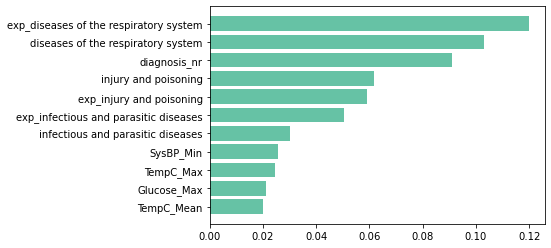

In [231]:
gb.fit(X_pp, y)
feat_indexes_gradboost = feature_imp(abs(gb.feature_importances_), feature_names)

In [232]:
feat_to_prop = [feature_names[i] for i in feat_indexes_gradboost][-5:]
pointer = [i for i, feat in enumerate(feature_names) if feat in feat_to_prop]
pointer

[26, 28, 31, 41, 46]

In [233]:
models = list()
models.append(SVR(gamma='scale'))
models.append(DecisionTreeRegressor())
models.append(KNeighborsRegressor())
models.append(AdaBoostRegressor())
models.append(RandomForestRegressor(n_estimators=10))
models.append(ExtraTreesRegressor(n_estimators=10))
models.append(HistGradientBoostingRegressor())

In [234]:
# train-test split
xtrain, xtest, ytrain, ytest=train_test_split(X_pp, y, test_size=0.2)

In [235]:
meta_learners = [
    ExtraTreesRegressor(n_estimators=100, max_features=0.5, bootstrap=True, random_state=SEED),
    RandomForestRegressor(n_estimators=100, max_features=0.5, bootstrap=True, random_state=SEED),
    GradientBoostingRegressor(learning_rate=0.1, n_estimators=100, random_state=SEED)
]

meta_learners_ = ['ExtraTrees', 'RandomForest', 'GradientBoosting']
scores={}

for i, meta_learner in enumerate(meta_learners):
    print(f'\nStackingPropagating {meta_learners_[i]}')
    super_learner = SuperLearner(folds=5, random_state=42)

    super_learner.add(models, propagate_features=pointer)
    super_learner.add_meta(meta_learner)
    super_learner.fit(xtrain, ytrain)
    
    y_pred_tr = super_learner.predict(xtrain)
    mse_tr = mean_squared_error(ytrain, y_pred_tr)
 
    y_pred = super_learner.predict(xtest)
    mse = mean_squared_error(ytest, y_pred)
    scores[f'StackingPropagating{meta_learners_[i]}'] = (super_learner, mse)
    
    print(f'Super Learner with {meta_learners_[i]} MSE score on train sample: {mse_tr}')
    print(f'Super Learner with {meta_learners_[i]} MSE score on test sample: {mse}\n')



StackingPropagating ExtraTrees
Super Learner with ExtraTrees MSE score on train sample: 12.656508777873563
Super Learner with ExtraTrees MSE score on test sample: 18.894390152073196


StackingPropagating RandomForest
Super Learner with RandomForest MSE score on train sample: 13.037592240048317
Super Learner with RandomForest MSE score on test sample: 19.706767060021747


StackingPropagating GradientBoosting
Super Learner with GradientBoosting MSE score on train sample: 18.12020404467013
Super Learner with GradientBoosting MSE score on test sample: 19.592779519782898



In [100]:
scores_all.update({"StackingPropagating ExtraTrees": 18.8943 ,
                 "StackingPropagating RandomForest": 19.7067 ,
                 "StackingPropagating GradientBoosting": 19.59277 })

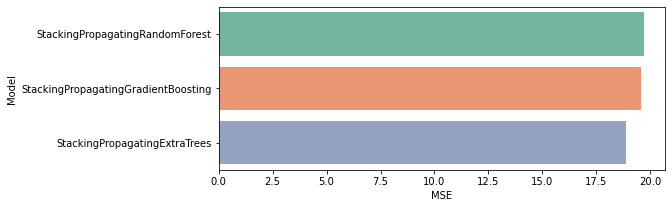

In [236]:
# look at ranking in terms of MSE
ranking = pd.DataFrame.from_dict(scores, orient='index').reset_index()

ranking.columns = ['Model', 'Setting', 'MSE']
ranking = ranking.sort_values(by='MSE', ascending=False).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(8, 3))
sns.barplot(x="MSE", y="Model", data=ranking, ax=ax);

In [102]:
# look at best model's performance
# test=test_work.drop(['subject_id', 'hadm_id', 'icustay_id',
#                     'DOB', 'ADMITTIME', 'Diff','year_of_birth', 'admission_year', "ICD9_diagnosis"
#                      ], axis=1)
# #test_pp = preprocessor.transform(test)
# y_test_pred=ranking.Setting[0].predict(test_pp)
# 
# 
# # Produce .csv for kaggle testing from the actual test set
# test_predictions_submit = pd.DataFrame({"icustay_id": test_final["icustay_id"], 
#                                         "LOS": y_test_pred})
# test_predictions_submit.to_csv("test_predictions_submit.csv", index = False)

#### Out of curiosity: apply SHAP for the feature propagation

Since SHAP basically allows us to show feature importance I had this idea to determine feature importance with SHAP for the GradientBoosting model to see whether there is a significant difference or that maybe I can get better predictions. 

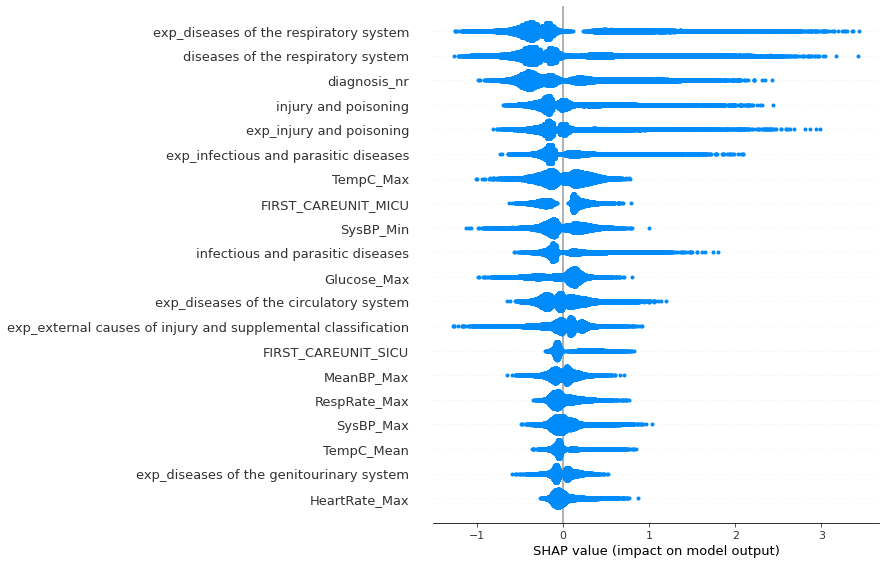

In [237]:
import shap
explainer = shap.Explainer(gb)
shap_values = explainer.shap_values(X_pp)
shap.initjs()
shap.summary_plot(shap_values, feature_names)

There is a slight difference between the "simple" and the SHAP-type feature importance plots. 
The first 5 are the same for both methods, but after that TempC_Max and FIRST_CAREUNIT_MICU variables appear. 

In order to see whether there is a difference I am going to include TempC_Max and FIRST_CAREUNIT_MICU variables and drop the dummies for injury and poisoning and diseases of the respiratory system. 

Let's see whether this makes a difference, but my expectation is that it won't. 

In [238]:
feat_to_prop = ["exp_diseases of the respiratory system", 
                "diagnosis_nr", 
                "exp_injury and poisonig",
                "TempC_Max", 
                "FIRST_CAREUNIT_MIC"]
pointer = [i for i, feat in enumerate(feature_names) if feat in feat_to_prop]


In [240]:
meta_learners = [
    ExtraTreesRegressor(n_estimators=100, max_features=0.5, bootstrap=True, random_state=SEED),
    RandomForestRegressor(n_estimators=100, max_features=0.5, bootstrap=True, random_state=SEED),
    GradientBoostingRegressor(learning_rate=0.1, n_estimators=100, random_state=SEED)
]

meta_learners_ = ['ExtraTrees', 'RandomForest', 'GradientBoosting']
scores={}

for i, meta_learner in enumerate(meta_learners):
    print(f'\nStackingPropagating {meta_learners_[i]}')
    super_learner = SuperLearner(folds=5, random_state=42)

    super_learner.add(models, propagate_features=pointer)
    super_learner.add_meta(meta_learner)
    super_learner.fit(xtrain, ytrain)
    
    y_pred_tr = super_learner.predict(xtrain)
    mse_tr = mean_squared_error(ytrain, y_pred_tr)
 
    y_pred = super_learner.predict(xtest)
    mse = mean_squared_error(ytest, y_pred)
    scores[f'StackingPropagating{meta_learners_[i]}'] = (super_learner, mse)
    
    print(f'Super Learner with {meta_learners_[i]} MSE score on train sample: {mse_tr}')
    print(f'Super Learner with {meta_learners_[i]} MSE score on test sample: {mse}\n')

    



StackingPropagating ExtraTrees
Super Learner with ExtraTrees MSE score on train sample: 11.505731554050508
Super Learner with ExtraTrees MSE score on test sample: 19.236482471840283


StackingPropagating RandomForest
Super Learner with RandomForest MSE score on train sample: 11.880635197865042
Super Learner with RandomForest MSE score on test sample: 19.86647438273609


StackingPropagating GradientBoosting
Super Learner with GradientBoosting MSE score on train sample: 16.787323876213968
Super Learner with GradientBoosting MSE score on test sample: 19.722104479904562



The MSE scores have not improved. 

In [103]:
scores_all.update({"StackingPropagating ExtraTrees (SHAP)": 19.236 ,
                 "StackingPropagating RandomForest (SHAP)": 19.8664 ,
                 "StackingPropagating GradientBoosting (SHAP)": 19.722 })

## Try neural networks

In [86]:
# Sklearn's MLPRegressor
from sklearn.neural_network import MLPRegressor

mlp = MLPRegressor(random_state=42)

# Gridsearch on the parameters
parameters_nn = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}

In [87]:
clf = GridSearchCV(mlp, parameters_nn, n_jobs=-1, cv=5, scoring='neg_mean_squared_error')
clf.fit(X_pp, y)

/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


GridSearchCV(cv=5, estimator=MLPRegressor(random_state=42), n_jobs=-1,
             param_grid={'activation': ['tanh', 'relu'],
                         'alpha': [0.0001, 0.05],
                         'hidden_layer_sizes': [(50, 50, 50), (50, 100, 50),
                                                (100,)],
                         'learning_rate': ['constant', 'adaptive'],
                         'solver': ['sgd', 'adam']},
             scoring='neg_mean_squared_error')

In [125]:
print("MSE: ", clf.best_score_)
print("Parameters: ", clf.best_params_)

MSE:  -25.325336428577973
Parameters:  {'activation': 'relu', 'alpha': 0.05, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'solver': 'adam'}


In [105]:
scores_all.update({"Sklearn MLP": 25.3253 })

In [126]:
#y_hat_train = first_MLP.predict(X_pp)
# y_test_pred = first_MLP.predict(test_pp)
# 
# # Produce .csv for kaggle testing from the actual test set
# test_predictions_submit = pd.DataFrame({"icustay_id": test_final["icustay_id"], 
#                                         "LOS": y_test_pred})
# test_predictions_submit.to_csv("test_predictions_submit.csv", index = False)

/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anacond

/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anacond

/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anacond

/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/pazma/opt/anacond

The Kaggle score was 112 after submission. Probably the model overfitted the data.

Let's give it a try with tensforflow. 

In [64]:
# Tensorflow
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [73]:
# prepare X and y
X = train_final.drop(['HOSPITAL_EXPIRE_FLAG','subject_id', 'hadm_id', 'icustay_id',
                           'DOB', 'ADMITTIME', 'Diff', 'DIAGNOSIS',
                          'LOS', 'year_of_birth','admission_year', 'ETHNICITY_orig'], axis = 1)
Y=train_final["LOS"]

# preprocess data
preprocessor.fit(X, Y)
X_pp = preprocessor.transform(X)

# split
X_train, X_test, y_train, y_test = train_test_split(X_pp, Y, test_size=0.2, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, 
                                                  random_state=1) # 0.25 x 0.8 = 0.2

In [66]:
tf.config.set_soft_device_placement(True) 

In [67]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping

# loss function
mse = tf.keras.losses.MeanSquaredError()

# callbacks
# es = EarlyStopping(monitor="val_loss", mode="min", verbose=1)
# loss = ModelCheckpoint('nn_model.h5', monitor='val_loss', verbose=1, save_best_only=True)

model = Sequential()
model.add(layers.Dense(19, activation='relu'))
#model.add(layers.BatchNormalization())
model.add(layers.Dense(19, activation='relu'))
#model.add(layers.BatchNormalization())

model.add(layers.Dense(19, activation='relu'))
#model.add(layers.BatchNormalization())
model.add(layers.Dense(19, activation='relu'))
#model.add(layers.BatchNormalization())
model.add(layers.Dropout(0.1))
model.add(layers.Dense(1, activation="linear"))

# compile model
opt = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss=mse, optimizer=opt)

model.fit(X_train, y_train, validation_data=(X_val, y_val), batch_size=16, epochs=100)

model.summary()


Metal device set to: Apple M1
Epoch 1/100


2022-03-25 17:18:35.023711: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-03-25 17:18:35.024102: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2022-03-25 17:18:35.139297: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


 10/784 [..............................] - ETA: 4s - loss: 74.0183  

2022-03-25 17:18:35.519708: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


784/784 [==============================] - ETA: 0s - loss: 23.2740

2022-03-25 17:18:40.009037: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


784/784 [==============================] - 5s 6ms/step - loss: 23.2740 - val_loss: 20.9866
Epoch 2/100
784/784 [==============================] - 5s 6ms/step - loss: 20.1448 - val_loss: 20.0502
Epoch 3/100
784/784 [==============================] - 5s 6ms/step - loss: 19.5542 - val_loss: 20.7795
Epoch 4/100
784/784 [==============================] - 5s 6ms/step - loss: 19.1072 - val_loss: 20.0891
Epoch 5/100
784/784 [==============================] - 5s 6ms/step - loss: 18.3478 - val_loss: 20.2163
Epoch 6/100
784/784 [==============================] - 5s 6ms/step - loss: 17.7816 - val_loss: 20.2563
Epoch 7/100
784/784 [==============================] - 5s 6ms/step - loss: 17.3995 - val_loss: 22.1627
Epoch 8/100
784/784 [==============================] - 5s 6ms/step - loss: 16.8870 - val_loss: 21.4010
Epoch 9/100
784/784 [==============================] - 5s 6ms/step - loss: 16.4522 - val_loss: 21.5571
Epoch 10/100
784/784 [==============================] - 5s 6ms/step - loss: 15.8027 -

<AxesSubplot:>

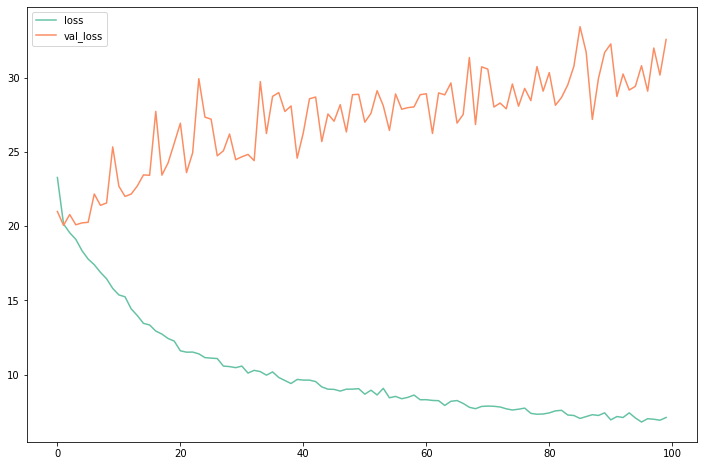

In [68]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot(figsize=(12,8))

2022-03-25 17:49:54.131068: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


MAE: 2.6374469219291328
MSE: 28.982531769533175
RMSE: 5.383542678342318
VarScore: -0.2096578769944326


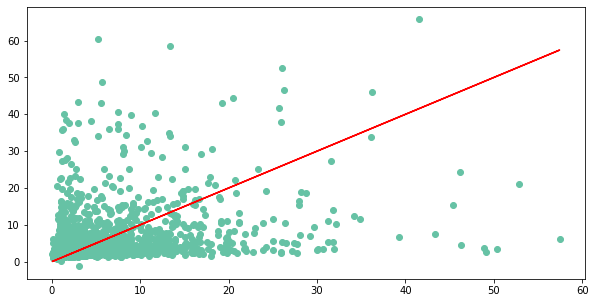

In [70]:
# Evaluation
y_pred = model.predict(X_test)
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred))  
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('VarScore:',metrics.explained_variance_score(y_test,y_pred))

# Visualizing predictions
fig = plt.figure(figsize=(10,5))
plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')

In [106]:
scores_all.update({"Neural Network (Tensorflow)": 28.982 })

/Users/pazma/Documents/tensorflow-test/env/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

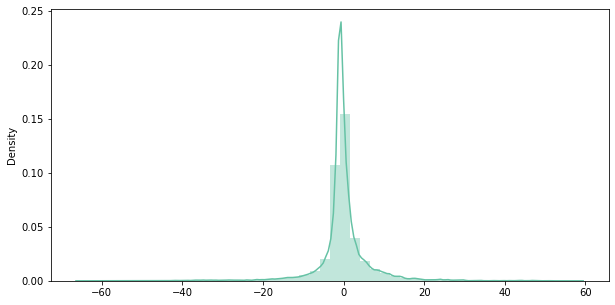

In [72]:
# visualizing residuals
fig = plt.figure(figsize=(10,5))
residuals = (y_test.values- y_pred)
sns.distplot(residuals)

## Compare results and interpret best model

In [108]:
# MSE scores of all the tested models
scores_all

{'DT: ': 23.081,
 'XGB': 19.966,
 'RandomForest': 19.473,
 'AdaBoost': 21.66,
 'GradientBoosting': 18.807,
 'Stacking Regressors': 19.23,
 'SuperLearner v1': 29.062881,
 'SuperLearner v2': 21.206,
 'StackingPropagating ExtraTrees': 18.8943,
 'StackingPropagating RandomForest': 19.7067,
 'StackingPropagating GradientBoosting': 19.59277,
 'StackingPropagating ExtraTrees (SHAP)': 19.236,
 'StackingPropagating RandomForest (SHAP)': 19.8664,
 'StackingPropagating GradientBoosting (SHAP)': 19.722,
 'Sklearn MLP': 25.3253,
 'Neural Network (Tensorflow)': 28.982}

In [109]:
ranking = pd.DataFrame.from_dict(scores_all, orient='index').reset_index()
ranking

,index,0
0,DT:,23.081000
1,XGB,19.966000
2,RandomForest,19.473000
3,AdaBoost,21.660000
4,GradientBoosting,18.807000
5,Stacking Regressors,19.230000
6,SuperLearner v1,29.062881
7,SuperLearner v2,21.206000
8,StackingPropagating ExtraTrees,18.894300
9,StackingPropagating RandomForest,19.706700


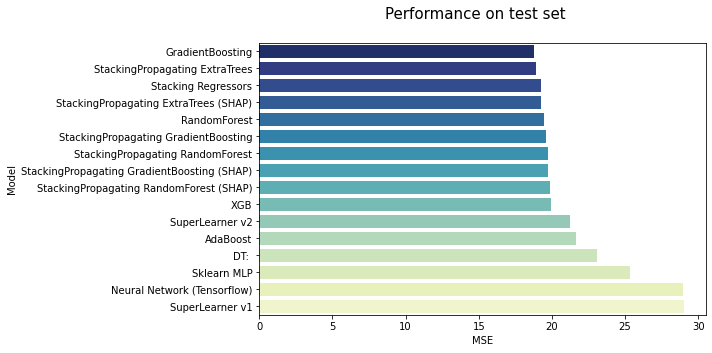

In [116]:
# Visualize
ranking = pd.DataFrame.from_dict(scores_all, orient='index').reset_index()

ranking.columns = ['Model', 'MSE']
ranking = ranking.sort_values(by='MSE', ascending=True).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(8, 5))
fig.suptitle("Performance on test set", fontsize=15)
sns.barplot(x="MSE", y="Model", data=ranking, ax=ax, palette="YlGnBu_r");

Best Model is the Gradient Boosting. 

In [63]:
# preprocess X just be sure that I am working with the good data
X = train_final.drop(['HOSPITAL_EXPIRE_FLAG','subject_id', 'hadm_id', 'icustay_id',
                           'DOB', 'ADMITTIME', 'Diff', 'DIAGNOSIS',"ICD9_diagnosis",
                          'LOS', 'year_of_birth','admission_year', 'ETHNICITY_orig'], axis = 1)
y=train_final["LOS"]

preprocessor.fit(X, y)
X_pp = preprocessor.transform(X)

In [64]:
# get feature names
feature_names=get_ct_feature_names(preprocessor)

/Users/pazma/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


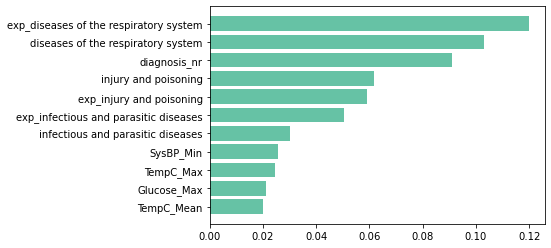

In [71]:
# Classic feature importance plot 
gb.fit(X_pp, y)
feat_indexes_gradboost = feature_imp(abs(gb.feature_importances_), feature_names)

In [75]:
import shap
explainer = shap.Explainer(gb)
shap_values = explainer.shap_values(X_pp)


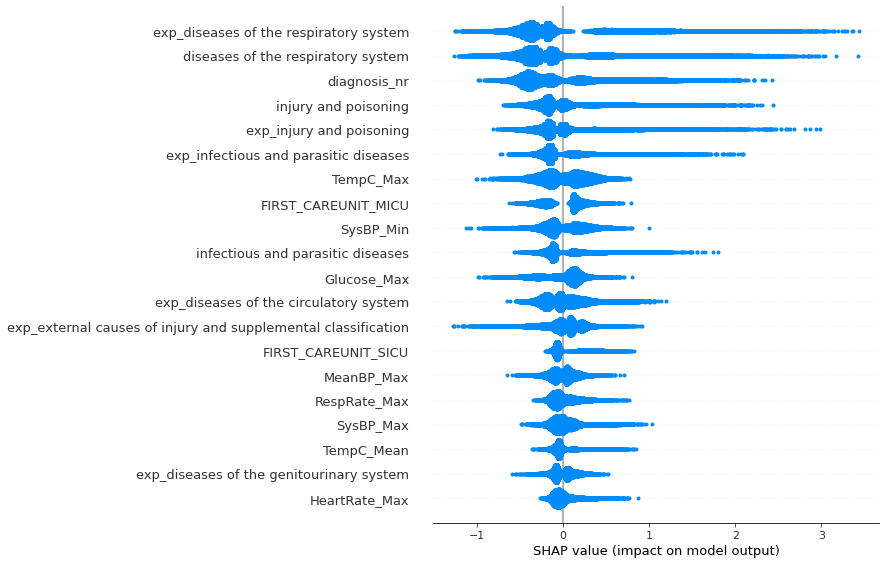

In [76]:
shap.initjs()
shap.summary_plot(shap_values, feature_names, cmap=plt.get_cmap("cool"))

In [80]:
# use the pointer to get the index of the most relevant features
feat_to_prop = ["exp_diseases of the respiratory system", 
                "diagnosis_nr", 
                "exp_injury and poisonig",
                "TempC_Max", 
                "FIRST_CAREUNIT_MIC"]
pointer = [i for i, feat in enumerate(feature_names) if feat in feat_to_prop]
pointer

[16, 26, 41]

In [82]:
feature_names.index("diagnosis_nr")

26

In [85]:
feature_names[46], feature_names[26]

('exp_injury and poisoning', 'diagnosis_nr')

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


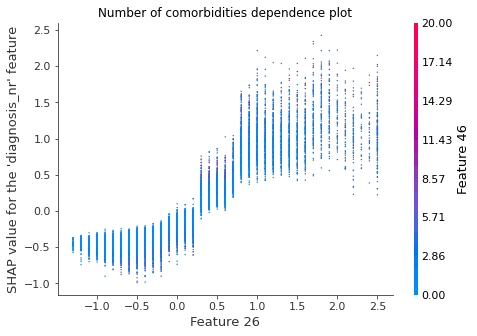

In [86]:
# create a dependence plot to show the effect of the number of comorbidities variable across the whole dataset
shap.dependence_plot(26, shap_values, X_pp, dot_size=2, show=False)
plt.title("Number of comorbidities dependence plot")
plt.ylabel("SHAP value for the 'diagnosis_nr' feature")
plt.show()

In [87]:
feature_names.index("exp_diseases of the respiratory system")

41

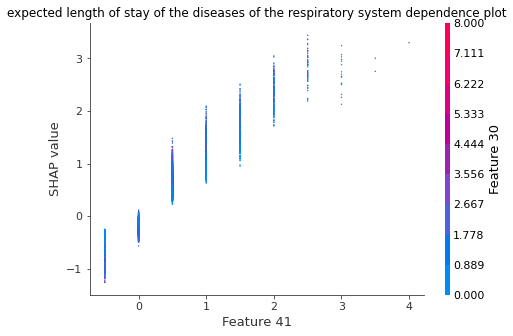

In [89]:
# show the effect of the expected length of stay of the diseases of the respiratory system variable 
shap.dependence_plot(41, shap_values, X_pp, dot_size=2, show=False)
plt.title("expected length of stay of the diseases of the respiratory system dependence plot")
plt.ylabel("SHAP value")
plt.show()

In [92]:
#%% THIS CODE TAKES A VERY LONG TIME TO RUN
# shap.initjs() 
# visualize the training set predictions
# shap.force_plot(explainer.expected_value, shap_values, feature_names)

#%% INSTEAD: 
# Show 10% of training set predictions
np.random.seed(2021)
random_mask = np.random.choice(a=[0,1], size=y.shape, p=[0.9,0.1])
shap.force_plot(explainer.expected_value, pd.DataFrame(shap_values)[random_mask == 1].values,
                feature_names)

In [74]:
# Create file for Kaggle submission with the best performing model
test=test_work.drop(['subject_id', 'hadm_id', 'icustay_id',
                    'DOB', 'ADMITTIME', 'Diff','year_of_birth', 'admission_year', "ICD9_diagnosis"
                     ], axis=1)
test_pp = preprocessor.transform(test)
y_test_pred=gb.predict(test_pp)

test_predictions_submit = pd.DataFrame({"icustay_id": test_work["icustay_id"], 
                                        "LOS": y_test_pred})
test_predictions_submit.to_csv("test_predictions_submit.csv", index = False)